# Comparación de diferentes clasificadores usando mapas autoorganizativos (SOM)

### **Pilar López de Soria, Santiago Ruiz Vilar, Yixi Zhang**

Para detalles del código empleado ver [el repositorio en Github](https://github.com/YixiZ04/Trabajo_IAA/).

En este trabajo principalmente se usa el Dataset PathMNIST del MedMNIST. PathMNIST consiste en imágenes histológicas del cáncer colorrectal, por conveniencia no se usa el val set:

* 89996 imágenes en el train set (92,6%)
* 7180 imágenes en el test set (7,4%)
* 9 clases:
    * adipose (0)
    * background (1)
    * debris (2)
    * lymphocytes (3)
    * mucus (4)
    * smooth muscle (5)
    * normal colon mucosa (6)
    * cancer-associated stroma (7)
    * colorectal adenocarcinoma epithelium (8)

**Tratamiento de datos**. Las imágenes tienen 28 $\times$ 28 píxeles, y el PathMNIST tiene 3 canales de colores (RGB), tras un aplanado tenemos un Array 2D con cada imágenes aplanados row-wise con 2352 entradas. Este array 2D es la entrada para la todos los clasificadores menos para el CNN, cuyo input serán tensores.

Se usan 5 clasificadores:

1. **RandomClassifier**. Este clasificador asume una distribución equitativa de clases (1/9 para cada clase), y hace una predicción aleatoria en base a ello.
2. **NaiveBayesClassifier**. Este clasficador se basa en el método de Naïve-Bayes usando densidades. Se calcula con el train set la media y desviación estándar de cada píxel, con los cuales se saca distribución Gaussiana logarítmica para cada píxel. Con el prior (frecuencia de cada clase) y las distribuciones se calcula el log Verosimilitud de cada entrada del test set y asigna clase más verosimil a cada entrada (argmax). Se asume independencia entre píxeles.
3. **BaggingNaiveBayesClassfier**. Este es clasificador de tipo Bagging con el clasificador Naïve Bayes como clasificador base. Se muestrea con reemplazo (Bootstrap) el train set, y con cada muestra se entrena un clasificador Naïve-Bayes distinto, y se hacen prediccioines sobre el test set con cada uno de los clasificadores entrenados y la predicción con mayor frecuencia es la predicción final.
4. **RandomForestClassifier**. Funciona igual que el clasificador anterior, pero con árbol de decisión como clasificador base.
5. **TorchCNNClassifier**. Es un CNN, cuya arquitectura se especifica en su apartado.

Todos los clasificadores se codificaron a mano, de tal forma que cada uno es un objeto diferente con diferentes métodos, para más detalles ver `/src/classifiers.py`.

**Pipeline**:
1. Entrenar un SOM con el train set y con ello ver la distribución del test set.
2. Hacer predicciones con diferentes clasificadores. Y con los resultados hacer plots:
    * Matriz de confusión.
    * SOM para los fallos.
    * SOM para los aciertos.
3. Comparar resultados y sacar conclusiones.

NOTA: En `Pipeline`, `SOM` del apartado 2 se refiere al heatmap y u-map.


# Importar módulos

In [1]:
import os

from src import *

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline


# 0. Conseguir datos

Nota: aquí los datos están en formato de np.array(). En el apartado de CNN se hará el fetch de datos para ello.

In [2]:
DATASET = "pathmnist"           #Cambiar esto para hacer clasificaciones sobre otros datasets del MedMNIST. (Puede dar errores si el dataset tiene >9 clases).
data_fetcher = MedMNISTDataFetcher(DATASET)
X_train, X_test, y_train, y_test = data_fetcher.to_array()
LABEL_DICT = data_fetcher.label_dict

Fetching data for pathmnist...
Done


In [3]:
scaled_X_train = X_train / 255
scaled_X_test = X_test / 255

In [4]:
print (f"X_train es de tipo: {type(X_train)} y tiene dimensiones: {X_train.shape}")
print(f"y_trian es de tipo {type(y_train)} y tiene dimensiones: {y_train.shape}")

X_train es de tipo: <class 'numpy.ndarray'> y tiene dimensiones: (89996, 2352)
y_trian es de tipo <class 'numpy.ndarray'> y tiene dimensiones: (89996,)


# 1. Entrenamiento de SOM. SOM para el test set.

* **Dimensiones** = 30 $\times$ 30 neuronas.
* **Topología**: hexagonal.
* **Función de distancia**: euclídea.
* **$\sigma$** =  5 (Número de vecinos que se actualiza en cada época).
* **$\eta$ o learning rate** = 0,5
* **Función de vecindad**: Gaussiana
* **épocas de entrenamiento** = 20000


In [5]:
PATH2FIG = os.path.join(".", "figures", "Test_set")
os.makedirs(PATH2FIG,exist_ok=True)

NAME4UMAP = "Test_set_umap.png"
NAME4HEATMAP = "Test_set_heatmap.png"
NAME4BOTH = "Test_set_both_plots.png"

NAME4IMAGES = "some_images.png"

In [6]:
som_builder = HexagonalSOMBuilder()
my_som = som_builder.train_som(scaled_X_train)

## 1.1. U-map y Heatmap para el test set

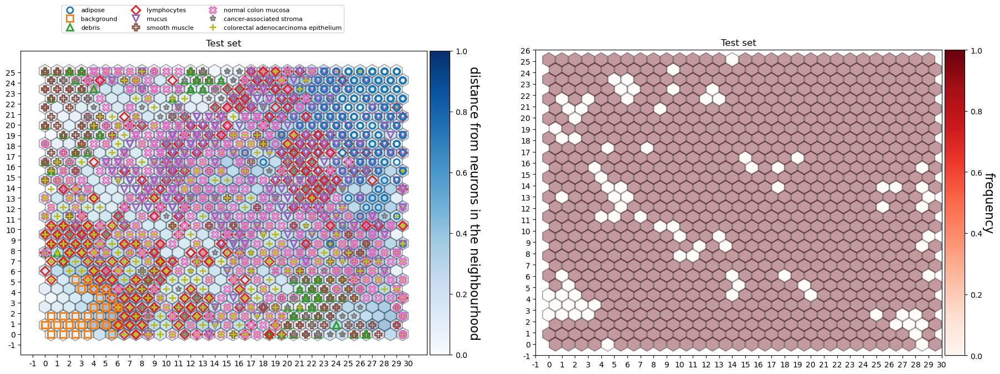

In [9]:
subplots_uheat_maps(my_som,
                    scaled_X_test,
                    y_test,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2FIG,
                    figname_umap= NAME4UMAP,
                    figname_heatmap= NAME4HEATMAP,
                    figname_all= NAME4BOTH,
                    figtitle="Test set",
                    item2plot=len(y_test))

## 1.2. Algunas imágenes del test set

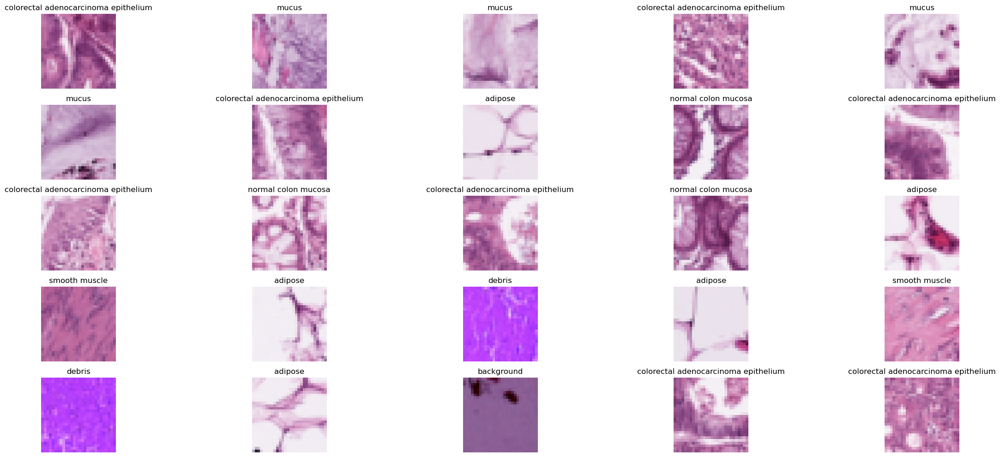

In [10]:
plot_some_images_with_label(scaled_X_test,
                            y_test,
                            save_fig_path=PATH2FIG,
                            figname=NAME4IMAGES,
                            dataset=DATASET)

## 1.3. Observaciones del test set.

Asumimos primero que con 20000 épocas, este SOM llega a la convergencia.

Parace ser que hay 2 tipos de tejidos que están más o menos asilados en el u-map: Tejido adiposo y "background". Indicando que un clasificador con un accuracy más o menos bueno debe hacer la predicción bien al menos en estos tejidos.

El tejido epitelial de adenocarcinoma colorrectal, aunque está muy disperso en el u-map, están colocados muchos en una neurona individual sin compartirla con otro tipo de tejido, lo que indica que un clasificador bueno, con un accuracy alto hará bien predicción sobre ella.

En la esquina izquierda superior, hay un pequeño grupo de tejido muscular aislado, sin embargo, no se sabe bien si los clasificadores harán bien sobre ella.

El resto de tejidos están dispersos en el u-map, además de que hay solapamiento; no es esperable que los clasificadores hagan bien sobre ellos.

Este SOM con sus dos representaciones (u-map y heatmap) será nuestra referencia para hacer comparaciones de clasificadores.

# 2. RandomClassifier

Es un clasificador NO supervisado, es decir, para el entrenamiento no requiere apreder sobre el label.

In [11]:
SOURCE_PATH = os.path.join(".", "figures", "RandomClassifier")
PATH2WRONGFIG =os.path.join(SOURCE_PATH, "wrong_predictions")
PATH2TRUEFIG = os.path.join(SOURCE_PATH, "true_predictions")

os.makedirs(PATH2WRONGFIG,exist_ok=True)
os.makedirs(PATH2TRUEFIG,exist_ok=True)

NAME4UMAP_WRONG = "RandonClassifier_wrong_predicted_umap.png"
NAME4HEATMAP_WRONG = "RandonClassifier_wrong_predicted_heatmap.png"
NAME4BOTH_WRONG = "RandonClassifier_wrong_predicted_both.png"

NAME4UMAP_TRUE = "RandonClassifier_true_predicted_umap.png"
NAME4HEATMAP_TRUE = "RandonClassifier_true_predicted_heatmap.png"
NAME4BOTH_TRUE = "RandonClassifier_true_predicted_both.png"

CFM_NAME = "RandomClassifier_confusion_matrix.png"

NAME4WRONG_IMAGES = "wrongly_predicted_images.png"
NAME4CORRECT_IMAGES = "correctly_predicted_images.png"


In [12]:
n_classes = len(np.unique(y_train))
random_classifier = RandomClassifier(n_classes=n_classes)
rcls_prediction = random_classifier.predict(scaled_X_test)

In [13]:
accuracy = random_classifier.accuracy(y_test)
print (f"El accuracy del RandomClassfier es {accuracy * 100:.2f}%")

El accuracy del RandomClassfier es 10.89%


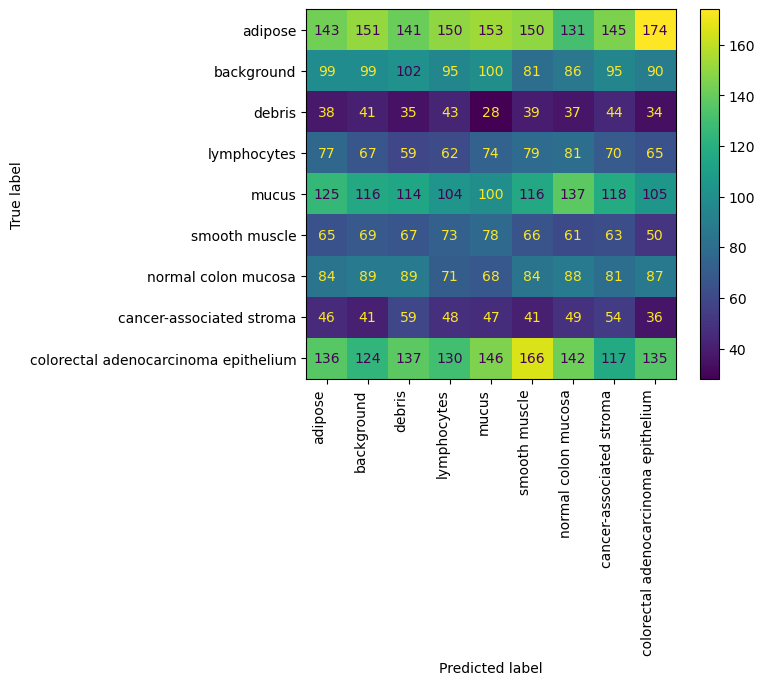

In [14]:
plot_confusion_matrix(y_true = y_test,
                      y_pred= rcls_prediction,
                      labels=LABEL_DICT.values(),
                      savefig_path=SOURCE_PATH,
                      figname=CFM_NAME,
                      )

## 2.1. U-map y Heatmap de las predicciones erróneas

In [15]:
from src.utils import PredictionInfoExtracter
info_extracter = PredictionInfoExtracter()
wrong_X, wrong_y, true_X, true_y, wrong_pred_y = info_extracter.extract(scaled_X_test,
                                                                        y_test,
                                                                        rcls_prediction)

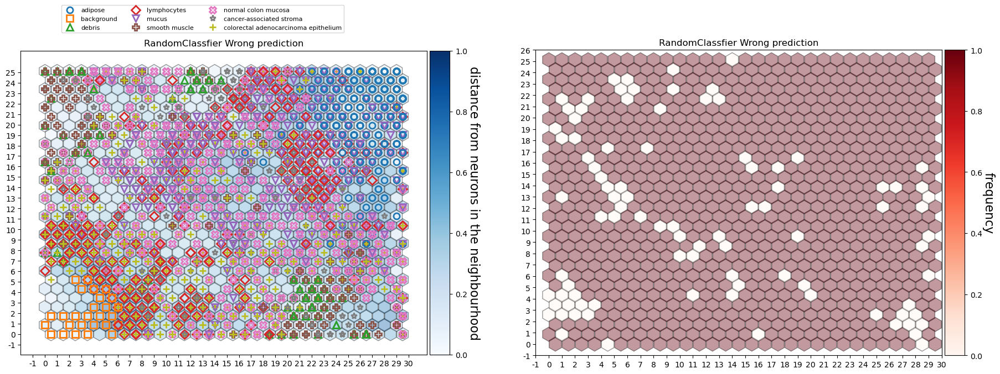

In [17]:
subplots_uheat_maps(my_som,
                    wrong_X,
                    wrong_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2WRONGFIG,
                    figname_umap= NAME4UMAP_WRONG,
                    figname_heatmap= NAME4HEATMAP_WRONG,
                    figname_all= NAME4BOTH_WRONG,
                    figtitle="RandomClassfier Wrong prediction",
                    item2plot=len(wrong_X))

## 2.2. U-map y Heatmap de las predicciones correctas

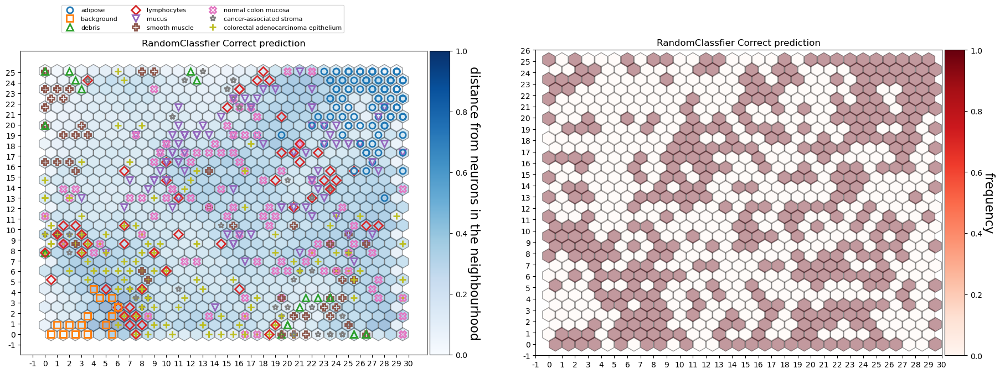

In [18]:
subplots_uheat_maps(my_som,
                    true_X,
                    true_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2TRUEFIG,
                    figname_umap= NAME4UMAP_TRUE,
                    figname_heatmap= NAME4HEATMAP_TRUE,
                    figname_all= NAME4BOTH_TRUE,
                    figtitle="RandomClassfier Correct prediction",
                    item2plot=len(true_y)
                    )

## 2.3. Algunas predicciones erróneas

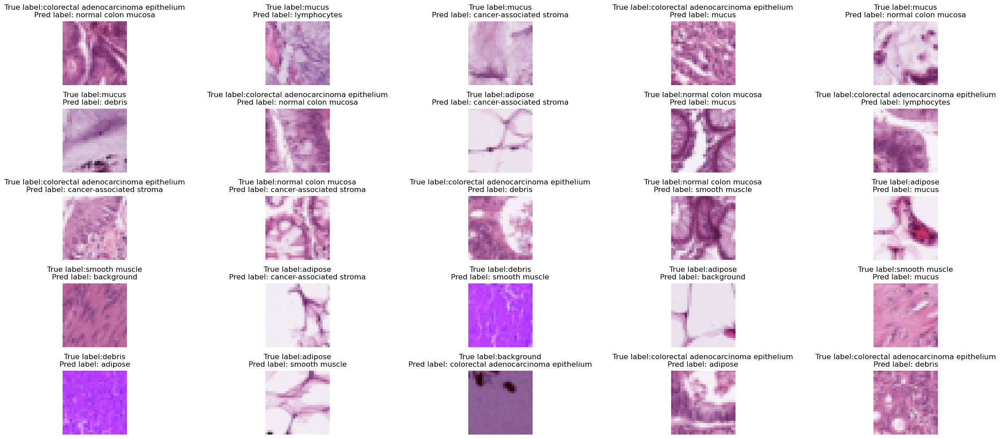

In [19]:
plot_some_wrongly_predicted_images(wrong_X,
                                   wrong_y,
                                   wrong_pred_y,
                                   save_fig_path=PATH2WRONGFIG,
                                   figname=NAME4WRONG_IMAGES,
                                   dataset=DATASET)

## 2.4. Algunas predicciones correctas

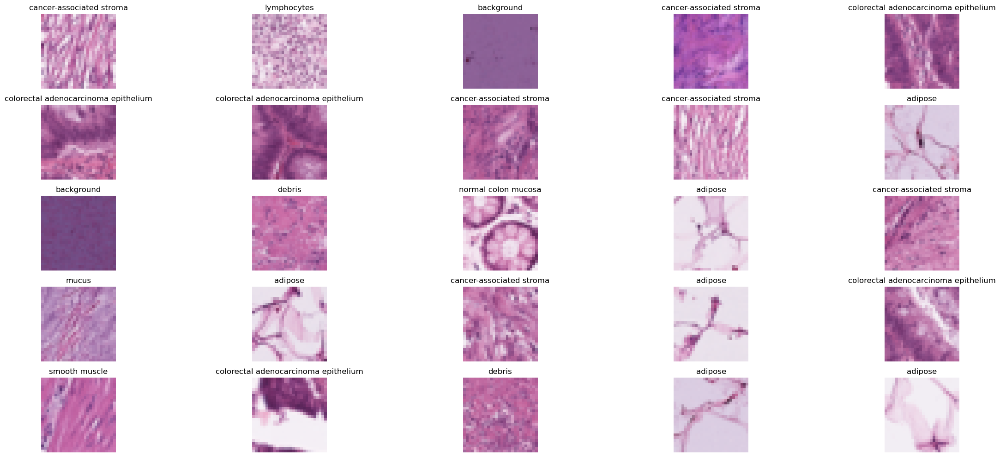

In [20]:
plot_some_images_with_label(true_X,
                            true_y,
                            save_fig_path=PATH2TRUEFIG,
                            figname=NAME4CORRECT_IMAGES,
                            dataset=DATASET)

## 2.5. Conclusiones del RandomClassfier

Accuracy ~= 11%. Esto es lo esperado asumiento que la distribución de cada tipo de tejido es uniforme, dado 9 clases, a cada clase se le atribuiría unos 11%, que es nuestro accuracy.

Viendo la matriz de confusión es fácil concluir que la predicción fue completamente aleatoria. Y los u-map y heatmap de predicciones erróneas son idénticas que los del test-set entero.

Este clasificador sirve como un baseline para hacer comparaciones con ella, si el accuracy de un clasificador es peor que este, habría que ver si hay algún error en el clasificador o si pasa algo con el dataset para que este caso poco probable ocurra. Dicho esto, lo esperado que cualquier otro clasificador sea mejor que este.

# 3. NaiveBayesClassifier

Este clasificador se basa en el algoritmo de Naïve-Bayes basado en densidades. La clase predicha es la que tiene mayor $\log \text{(verosimilitud)}$, teniendo en cuenta el $\log \text{(prior)}$ y la distribución de intensidad de cada píxel (RGB). En el API, hay un smoothing de $1e-9$ para evitar división a 0. Es un clasificador supervisado, dado que necesita labels en el proceso de entrenamiento.

Se ha optimizado con operaciones vectorizados con arrays de numpy para evitar varios nested loops para aumentar el rendimiento, dado que el input set es grande (>80000 entradas con 2352 pixeles por entrada). Ver más detalles: `./src/classfiers.py`

In [27]:
SOURCE_PATH = os.path.join(".", "figures", "NaiveBayesClassifier")
PATH2WRONGFIG =os.path.join(SOURCE_PATH, "wrong_predictions")
PATH2TRUEFIG = os.path.join(SOURCE_PATH, "true_predictions")

os.makedirs(PATH2WRONGFIG,exist_ok=True)
os.makedirs(PATH2TRUEFIG,exist_ok=True)

NAME4UMAP_WRONG = "NaiveBayesClassifier_wrong_predicted_umap.png"
NAME4HEATMAP_WRONG = "NaiveBayesClassifierr_wrong_predicted_heatmap.png"
NAME4BOTH_WRONG = "NaiveBayesClassifier_wrong_predicted_both.png"

NAME4UMAP_TRUE = "NaiveBayesClassifier_true_predicted_umap.png"
NAME4HEATMAP_TRUE = "NaiveBayesClassifier_true_predicted_heatmap.png"
NAME4BOTH_TRUE = "NaiveBayesClassifier_true_predicted_both.png"

CFM_NAME = "NaiveBayesClassifier_confusion_matrix.png"

NAME4WRONG_IMAGES = "wrongly_predicted_images.png"
NAME4CORRECT_IMAGES = "correctly_predicted_images.png"

In [22]:
n_classes = len(np.unique(y_train))
nb_classifier =NaiveBayesClassifier()
nbcls_prediction = nb_classifier.fit_predict(scaled_X_train,
                                             y_train,
                                             scaled_X_test,
                                             y_test)

In [23]:
accuracy = nb_classifier.accuracy
print (f"El accuracy del NaiveBayesClassfier es {accuracy * 100:.2f}%")

El accuracy del NaiveBayesClassfier es 42.47%


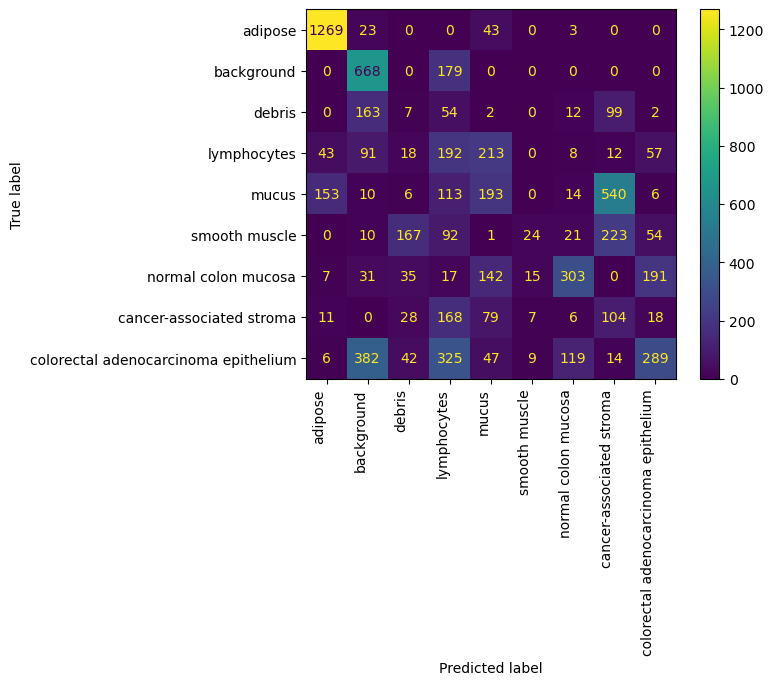

In [24]:
plot_confusion_matrix(y_true = y_test,
                      y_pred= nbcls_prediction,
                      labels=LABEL_DICT.values(),
                      savefig_path=SOURCE_PATH,
                      figname=CFM_NAME,
                      )

## 3.1 U-map y Heatmap de las predicciones erróneas

In [25]:
info_extracter = PredictionInfoExtracter()
wrong_X, wrong_y, true_X, true_y, wrong_pred_y = info_extracter.extract(scaled_X_test,
                                                                        y_test,
                                                                        nbcls_prediction)

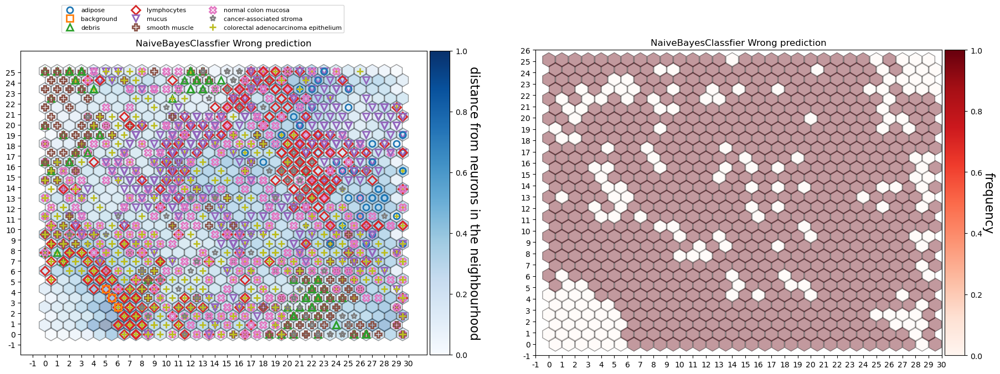

In [28]:
subplots_uheat_maps(my_som,
                    wrong_X,
                    wrong_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2WRONGFIG,
                    figname_umap= NAME4UMAP_WRONG,
                    figname_heatmap= NAME4HEATMAP_WRONG,
                    figname_all= NAME4BOTH_WRONG,
                    figtitle="NaiveBayesClassfier Wrong prediction",
                    item2plot=len(wrong_X))

## 3.2. U-map y Heatmap de las predicciones correctas

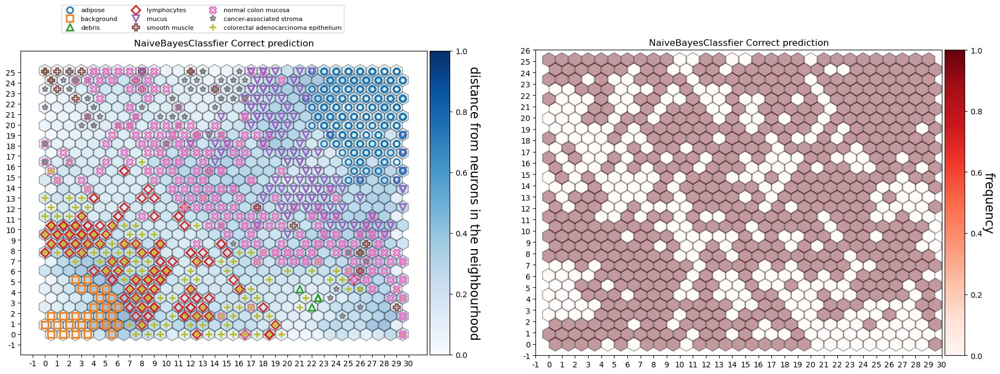

In [29]:
subplots_uheat_maps(my_som,
                    true_X,
                    true_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2TRUEFIG,
                    figname_umap= NAME4UMAP_TRUE,
                    figname_heatmap= NAME4HEATMAP_TRUE,
                    figname_all= NAME4BOTH_TRUE,
                    figtitle="NaiveBayesClassfier Correct prediction",
                    item2plot=len(true_X)
                    )

## 3.3. Algunas predicciones erróneas

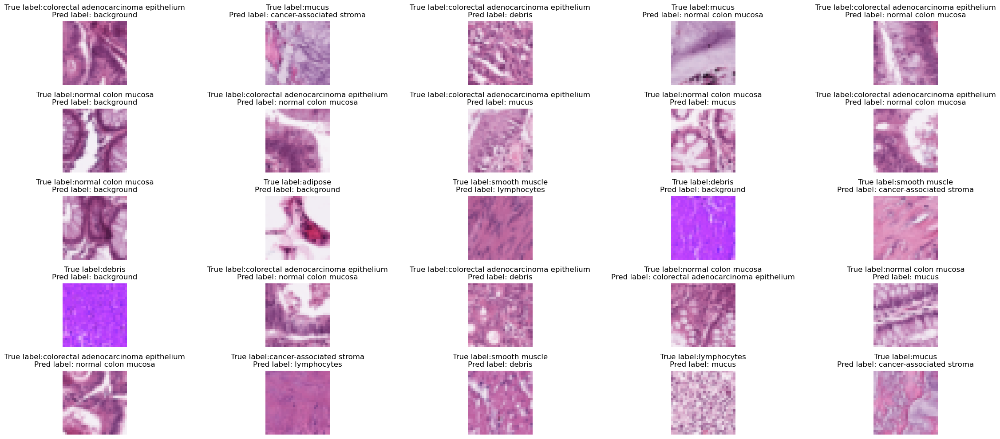

In [30]:
plot_some_wrongly_predicted_images(wrong_X,
                                   wrong_y,
                                   wrong_pred_y,
                                   save_fig_path=PATH2WRONGFIG,
                                   figname=NAME4WRONG_IMAGES,
                                   dataset=DATASET)

## 3.4. Algunas predicciones correctas

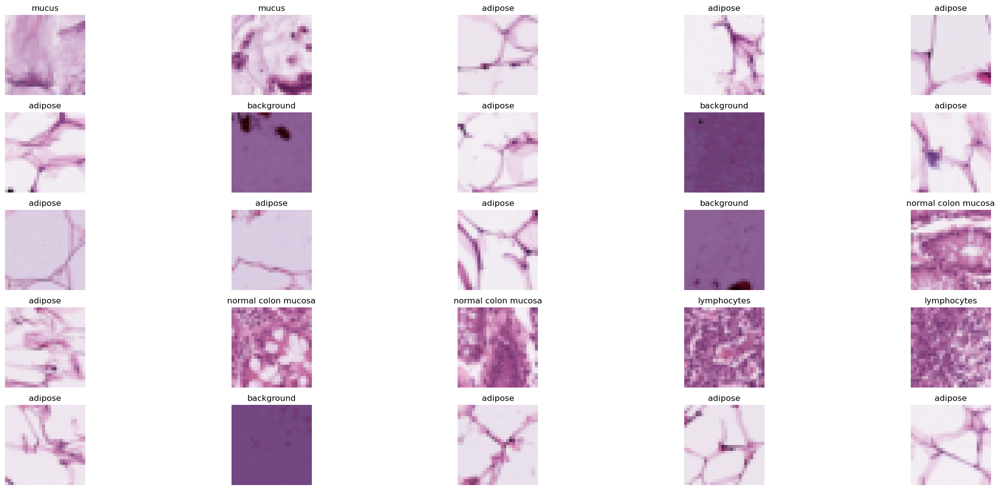

In [31]:
plot_some_images_with_label(true_X,
                            true_y,
                            save_fig_path=PATH2TRUEFIG,
                            figname=NAME4CORRECT_IMAGES,
                            dataset=DATASET)

## 3.5. Conclusiones de NaivaBayesClassifier

Accuracy = 42.47%. Principalmente contribuido por las clasificaciones correctas del tejido adiposo y background. Aunque hay confusión entre esos 2 tejidos, lo que no era lo esperado, es normal para un clasificador tan simple usado en una tarea de clasificación de imágenes RBG, con 2352 entradas cada una.

# 4. BaggingNaiveBayesClassifier

Este es un clasificador de tipo Bagging, con NaivaBayes classifier contruido anteriormente. Consiste en entrenar diferentes clasificadores con diferentes muestras del dataset conseguido por muestreo con reemplazo (Bootstrapping). Dependiendo del base classfier, este puede ser supervisado o no.

En este caso, dado un clasificador Naive-Bayes como clasificador base, la varianza es muy baja, entonces, para aumentarlo y ver la diferencia, cada muestra empleado para el entrenamiento tiene la mitad del tamaño del dataset de entrenamiento total. Por defecto, se entrenan 50 clasificadores con 50 muestras diferentes, este número puede darse como input al objeto.

In [32]:
SOURCE_PATH = os.path.join(".", "figures", "BaggingNaiveBayesClassifier")
PATH2WRONGFIG =os.path.join(SOURCE_PATH, "wrong_predictions")
PATH2TRUEFIG = os.path.join(SOURCE_PATH, "true_predictions")

os.makedirs(PATH2WRONGFIG,exist_ok=True)
os.makedirs(PATH2TRUEFIG,exist_ok=True)

NAME4UMAP_WRONG = "BaggingNaiveBayesClassifier_wrong_predicted_umap.png"
NAME4HEATMAP_WRONG = "BaggingNaiveBayesClassifier_wrong_predicted_heatmap.png"
NAME4BOTH_WRONG = "BaggingNaiveBayesClassifier_wrong_predicted_both.png"

NAME4UMAP_TRUE = "BaggingNaiveBayesClassifier_true_predicted_umap.png"
NAME4HEATMAP_TRUE = "BaggingNaiveBayesClassifier_true_predicted_heatmap.png"
NAME4BOTH_TRUE = "BaggingNaiveBayesClassifier_true_predicted_both.png"

CFM_NAME = "BaggingNaiveBayesClassifier_confusion_matrix.png"

NAME4WRONG_IMAGES = "wrongly_predicted_images.png"
NAME4CORRECT_IMAGES = "correctly_predicted_images.png"

In [33]:
bnb_classifier =BaggingNaiveBayesClassifier()
bnbcls_prediction = bnb_classifier.fit_predict(scaled_X_train, y_train, scaled_X_test, y_test)

In [34]:
accuracy = bnb_classifier.accuracy
print (f"El accuracy del BaggingNaiveBayesClassfier es {accuracy * 100:.2f}%")

El accuracy del BaggingNaiveBayesClassfier es 42.52%


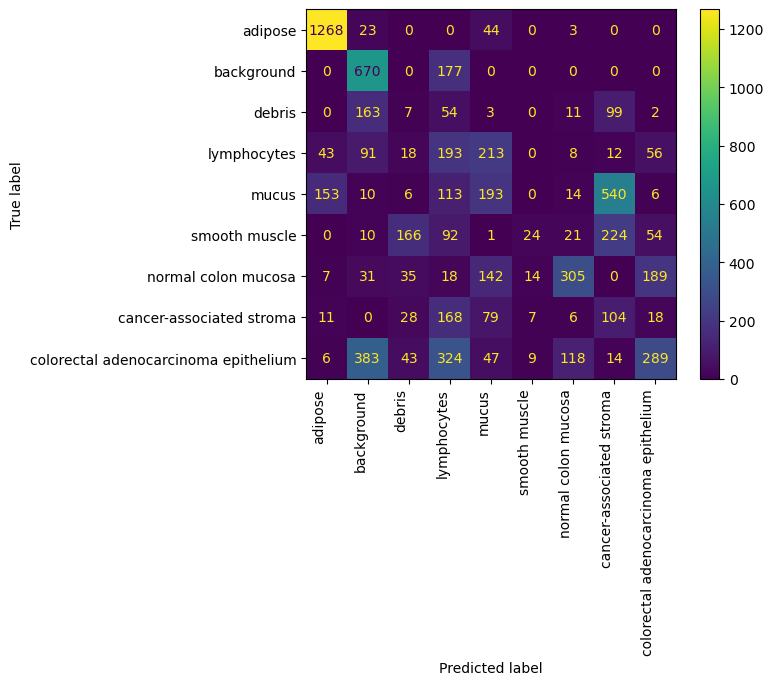

In [35]:
plot_confusion_matrix(y_true = y_test,
                      y_pred= bnbcls_prediction,
                      labels=LABEL_DICT.values(),
                      savefig_path=SOURCE_PATH,
                      figname=CFM_NAME,
                      )

## 4.1. U-map y Heatmap de las predicciones erróneas

In [36]:
info_extracter = PredictionInfoExtracter()
wrong_X, wrong_y, true_X, true_y, wrong_pred_y = info_extracter.extract(scaled_X_test,
                                                                        y_test,
                                                                        bnbcls_prediction)

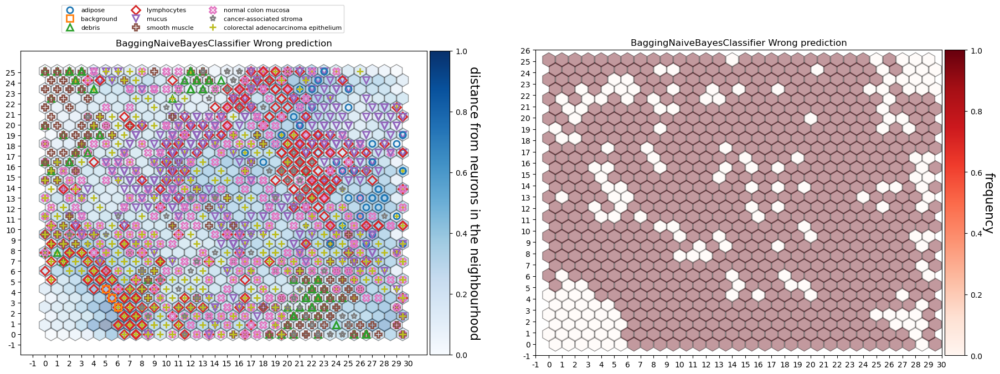

In [37]:
subplots_uheat_maps(my_som,
                    wrong_X,
                    wrong_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2WRONGFIG,
                    figname_umap= NAME4UMAP_WRONG,
                    figname_heatmap= NAME4HEATMAP_WRONG,
                    figname_all= NAME4BOTH_WRONG,
                    figtitle="BaggingNaiveBayesClassifier Wrong prediction",
                    item2plot=len(wrong_X),)

## 4.2. U-map y Heatmap de las predicciones correctas

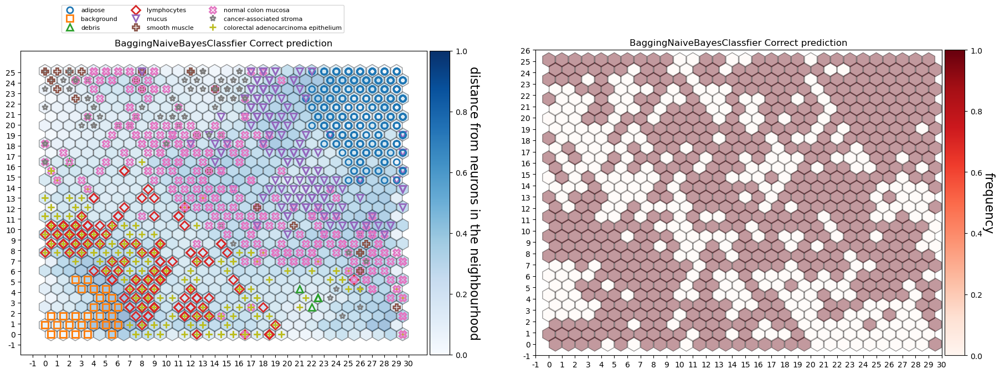

In [38]:
subplots_uheat_maps(my_som,
                    true_X,
                    true_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2TRUEFIG,
                    figname_umap= NAME4UMAP_TRUE,
                    figname_heatmap= NAME4HEATMAP_TRUE,
                    figname_all= NAME4BOTH_TRUE,
                    figtitle="BaggingNaiveBayesClassfier Correct prediction",
                    item2plot=len(true_y)
                    )

## 4.3. Algunas predicciones erróneas

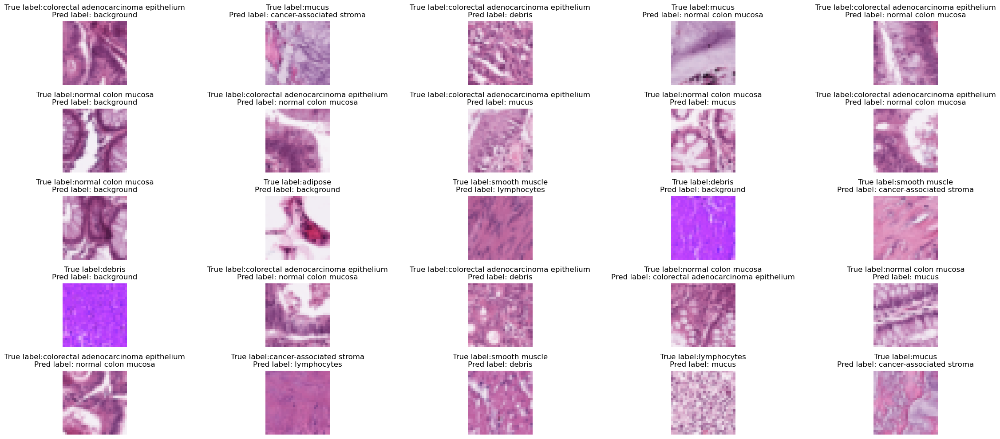

In [39]:
plot_some_wrongly_predicted_images(wrong_X,
                                   wrong_y,
                                   wrong_pred_y,
                                   save_fig_path=PATH2WRONGFIG,
                                   figname=NAME4WRONG_IMAGES,
                                   dataset=DATASET,)

## 4.4. Algunas predicciones correctas

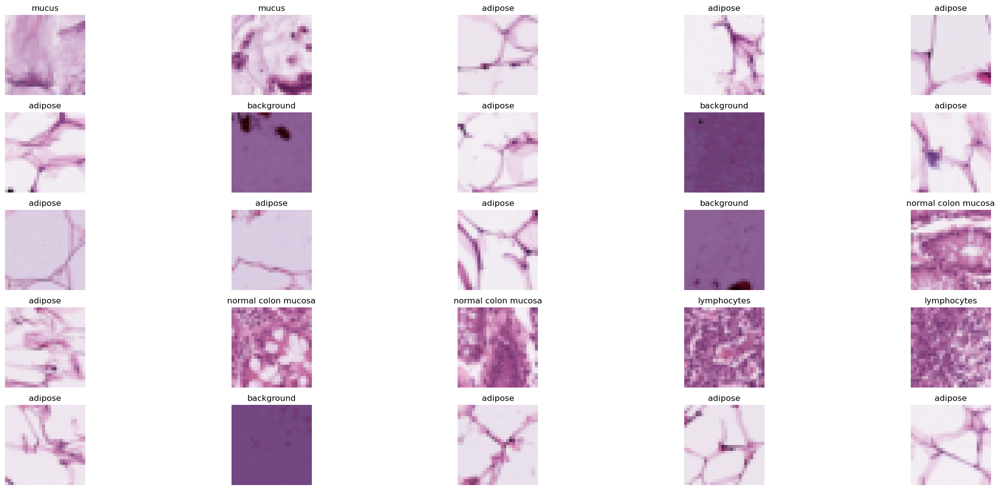

In [40]:
plot_some_images_with_label(true_X,
                            true_y,
                            save_fig_path=PATH2TRUEFIG,
                            figname=NAME4CORRECT_IMAGES,
                            dataset=DATASET,)

## 4.5. Conclusiones del BaggingNaiveBayesClassifier

Accuracy = 42.52%. Mejoró un 0.05% comparado con el NaiveBayesClassfier. Si comparamos SOM de estos dos clasificadore, vemos que apenas hay diferencia. Sin embargo, como mencionado anteriormente, esto es esperable, aunque hemos intentado que el dataset de training de cada base classifier tenga la mitad del tamaño del dataset usado para entrenar NaiveBayesClassfier.

Luego, este Bagging classifier tarda unos 2 minutos en entrenarse y hacer predicciones, mientras que uno individual tarda menos de 20s. Probablemente no merece la pena gastar tanto tiempo de más para una mejora de 0.05%.

# 5. RandomForestClassfier

Es otro tipo de Bagging Classifiers, pero en este caso, el base classfier es árbol de decisión. Es un clasificador supervisado, y aquí tiene mucho más sentido, porque la varianza entre clasificadores individuales es grande.

Para hacerlo comparable con el Bagging classfier anterior, `n_estimators` se ajusta a 50. Y como el árbol de decisión es más complicado sacarlo "a mano", se aprovecha el RandomForestClassfier del `sklearn`.

In [7]:
SOURCE_PATH = os.path.join(".", "figures", "RandomForestClassifier")
PATH2WRONGFIG =os.path.join(SOURCE_PATH, "wrong_predictions")
PATH2TRUEFIG = os.path.join(SOURCE_PATH, "true_predictions")

os.makedirs(PATH2WRONGFIG,exist_ok=True)
os.makedirs(PATH2TRUEFIG,exist_ok=True)

NAME4UMAP_WRONG = "RandomForestClassifier_wrong_predicted_umap.png"
NAME4HEATMAP_WRONG = "RandomForestClassifier_wrong_predicted_heatmap.png"
NAME4BOTH_WRONG = "RandomForestClassifier_wrong_predicted_both.png"

NAME4UMAP_TRUE = "RandomForestClassifier_true_predicted_umap.png"
NAME4HEATMAP_TRUE = "RandomForestClassifier_true_predicted_heatmap.png"
NAME4BOTH_TRUE = "RandomForestClassifier_true_predicted_both.png"

CFM_NAME = "RandomForestClassifier_confusion_matrix.png"

NAME4WRONG_IMAGES = "wrongly_predicted_images.png"
NAME4CORRECT_IMAGES = "correctly_predicted_images.png"

In [8]:
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(n_estimators=50,
                                       random_state=42,)
rf_classifier.fit (scaled_X_train,y_train)

rfcls_prediction = rf_classifier.predict(scaled_X_test)


In [9]:
accuracy = rf_classifier.score (scaled_X_test,y_test)
print (f"El accuracy del RandomForestClassfier es {accuracy * 100:.2f}%")

El accuracy del RandomForestClassfier es 60.95%


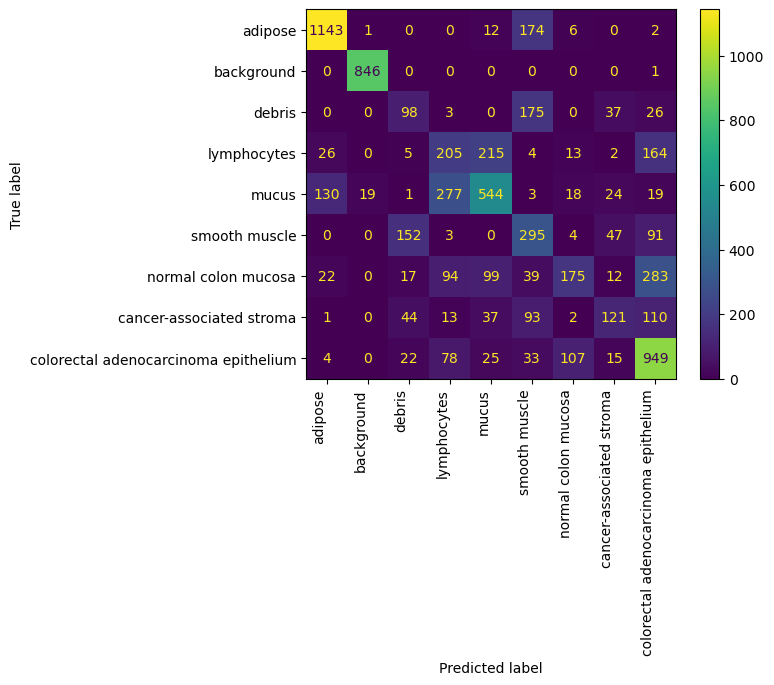

In [10]:
plot_confusion_matrix(y_true = y_test,
                      y_pred= rfcls_prediction,
                      labels=LABEL_DICT.values(),
                      savefig_path=SOURCE_PATH,
                      figname=CFM_NAME,
                      )

## 5.1. U-map y Heatmap de las predicciones erróneas

In [11]:
info_extracter = PredictionInfoExtracter()
wrong_X, wrong_y, true_X, true_y, wrong_pred_y = info_extracter.extract(scaled_X_test,
                                                                        y_test,
                                                                        rfcls_prediction)

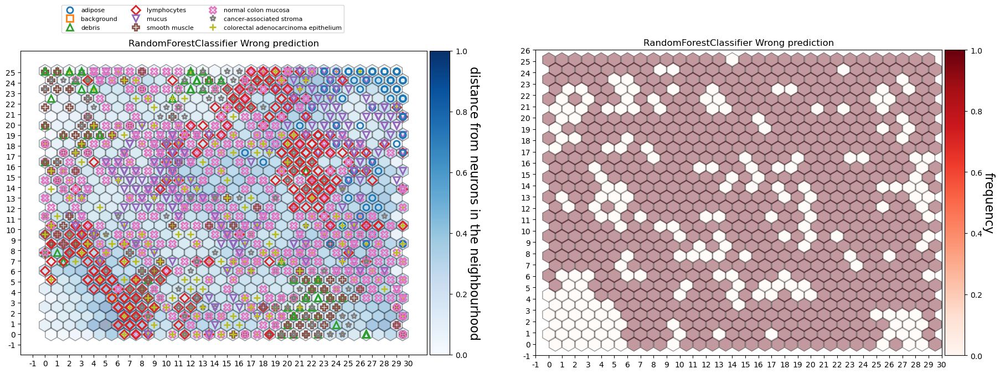

In [12]:
subplots_uheat_maps(my_som,
                    wrong_X,
                    wrong_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2WRONGFIG,
                    figname_umap= NAME4UMAP_WRONG,
                    figname_heatmap= NAME4HEATMAP_WRONG,
                    figname_all= NAME4BOTH_WRONG,
                    figtitle="RandomForestClassifier Wrong prediction",
                    item2plot=len(wrong_X))

## 5.2. U-map y Heatmap de las predicciones correctas

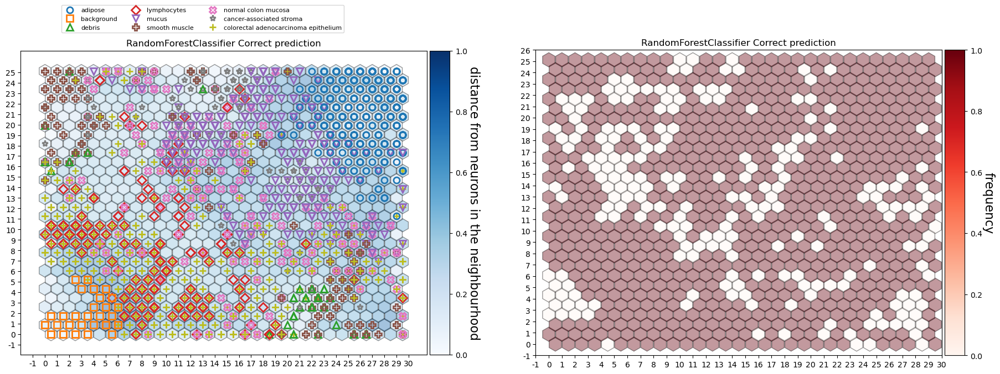

In [13]:
subplots_uheat_maps(my_som,
                    true_X,
                    true_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2TRUEFIG,
                    figname_umap= NAME4UMAP_TRUE,
                    figname_heatmap= NAME4HEATMAP_TRUE,
                    figname_all= NAME4BOTH_TRUE,
                    figtitle="RandomForestClassifier Correct prediction",
                    item2plot=len(true_X)
                    )

## 5.3. Algunas predicciones erróneas

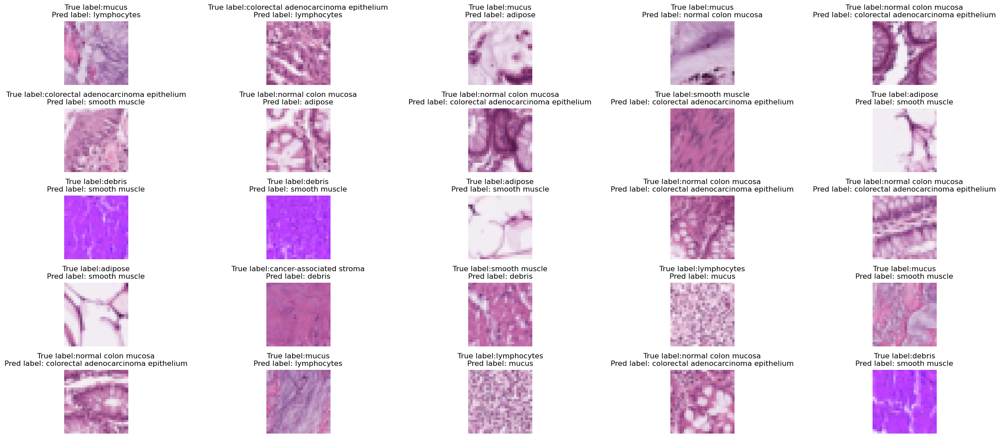

In [14]:
plot_some_wrongly_predicted_images(wrong_X,
                                   wrong_y,
                                   wrong_pred_y,
                                   save_fig_path=PATH2WRONGFIG,
                                   figname=NAME4WRONG_IMAGES,
                                   dataset=DATASET,)

## 5.4. Algunas predicciones correctas

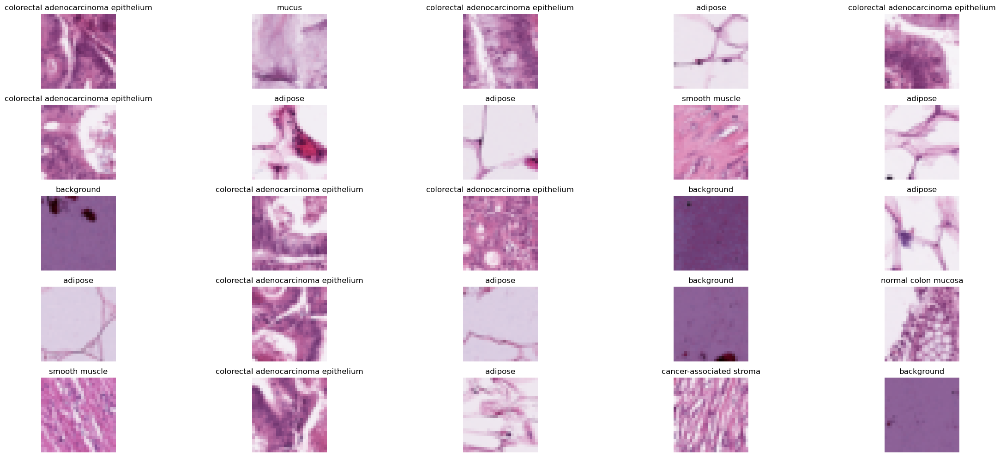

In [15]:
plot_some_images_with_label(true_X,
                            true_y,
                            save_fig_path=PATH2TRUEFIG,
                            figname=NAME4CORRECT_IMAGES,
                            dataset=DATASET,)

## 5.5. Conclusiones del RandomForestClassifier

Accuracy = 60.95%. Como mencionado en el apartado 1.3., además de que clasifica bien los tejidos adiposos y background (además, apenas no hay la confusión entre estos tipos de tejidos), este clasificador hace bien con el tejido epitelial de adenocarcinoma colorrectal, que la mayoría aunque tiene neuronas vecinas de diferentes tipos de tejido, están en neuronas sin overlapping con otro tipo de tejido.

Sin embargo, la clasificación del resto de tipo de tejidos ya no lo hace muy bien.

No se realizó comparación con un decision-tree individual porque este último es muy variable, y uno solo no es nada represetativo, sobre todo para este caso, que es una tarea de clasificación muy complejo.

# 6. Convolutional Neural Network (CNN)

Se construyó con Torch. La arquitectura es la siguiente:
* 4 capas convolucionales.
    * kernel_size = 3
    * Padding = 1
    * BatchNormalization=True
    * ReLU como función activación.
    * Amplifica las canales de entrada a 64.
* Capa de Flatten. Si la entrada es de 28$\times$28, aquí el número de Features de entrada es de 64$\times$7$\times$7.
* MLP (Multi-Layer Perceptron):
    * Input Layer.
    * Hidden Layer.
    * Hidden Layer.
    * Output Layer.

Optimizador: Adam.

Loss function: CrossEntropy

In [67]:
SOURCE_PATH = os.path.join(".", "figures", "CNNClassifier")
PATH2WRONGFIG = os.path.join(SOURCE_PATH, "wrong_predictions")
PATH2TRUEFIG = os.path.join(SOURCE_PATH, "true_predictions")

os.makedirs(PATH2WRONGFIG, exist_ok=True)
os.makedirs(PATH2TRUEFIG, exist_ok=True)

NAME4UMAP_WRONG = "CNNClassifier_wrong_predicted_umap.png"
NAME4HEATMAP_WRONG = "CNNClassifier_wrong_predicted_heatmap.png"
NAME4BOTH_WRONG = "CNNClassifier_wrong_predicted_both.png"

NAME4UMAP_TRUE = "CNNClassifier_true_predicted_umap.png"
NAME4HEATMAP_TRUE = "CNNClassifier_true_predicted_heatmap.png"
NAME4BOTH_TRUE = "CNNClassifier_true_predicted_both.png"

CFM_NAME = "CNNClassifier_confusion_matrix.png"

NAME4WRONG_IMAGES = "wrongly_predicted_images.png"
NAME4CORRECT_IMAGES = "correctly_predicted_images.png"

In [68]:
train_dataset, test_dataset = data_fetcher.to_torch_dataset()
IN_CHANNELS = data_fetcher.channels

Dataset PathMNIST of size 28 (pathmnist)
    Number of datapoints: 89996
    Root location: C:\Users\leonz\.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'adipose', '1': 'background', '2': 'debris', '3': 'lymphocytes', '4': 'mucus', '5': 'smooth muscle', '6': 'normal colon mucosa', '7': 'cancer-associated stroma', '8': 'colorectal adenocarcinoma epithelium'}
    Number of samples: {'train': 89996, 'val': 10004, 'test': 7180}
    Description: The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3×224×224 into 3×28×28, and split NCT-CR

In [69]:
cnn_classifier = TorchCNNClassifier (train_data=train_dataset,
                                     test_data=test_dataset,
                                     in_channels =IN_CHANNELS,
                                     n_classes=n_classes,
                                     num_epochs=20)

In [70]:
cnn_prediction = cnn_classifier.fit_predict()

100%|██████████| 113/113 [00:01<00:00, 80.28it/s]


In [71]:
accuracy = cnn_classifier.accuracy
print (f"El accuracy del CNN es {accuracy * 100:.2f}%")

El accuracy del CNN es 81.35%


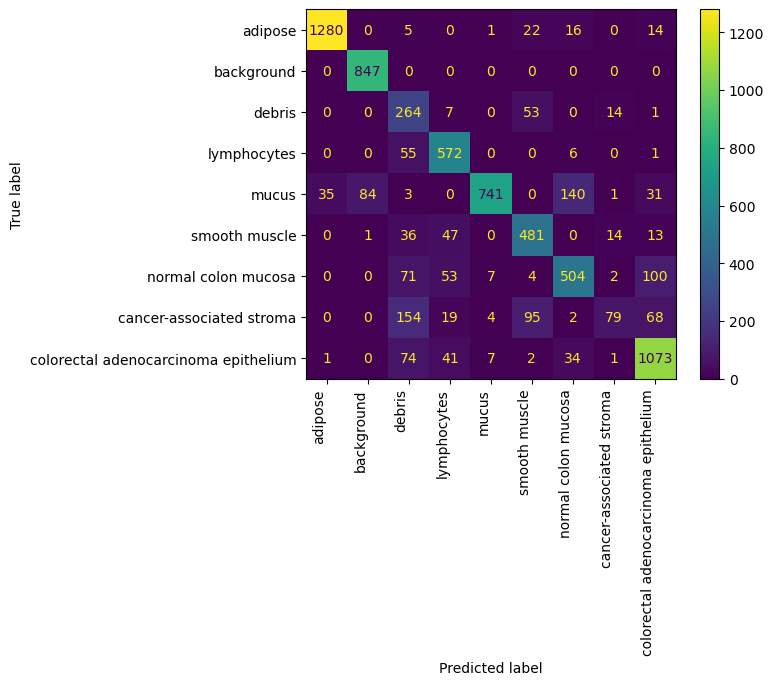

In [72]:
plot_confusion_matrix(y_true = y_test,
                      y_pred= cnn_prediction,
                      labels=LABEL_DICT.values(),
                      savefig_path=SOURCE_PATH,
                      figname=CFM_NAME,
                      )

## 6.1. U-map y Heatmap de las predicciones erróneas

In [73]:
info_extracter = PredictionInfoExtracter()
wrong_X, wrong_y, true_X, true_y,wrong_pred_y = info_extracter.extract(scaled_X_test,y_test, cnn_prediction)
wrong_X [0]

array([0.76862745, 0.60392157, 0.74509804, ..., 0.72156863, 0.44705882,
       0.64705882], shape=(2352,))

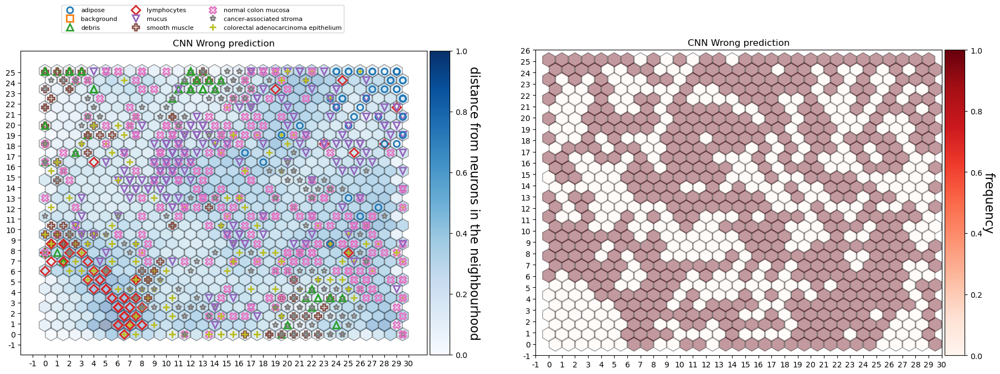

In [74]:
subplots_uheat_maps(my_som,
                    wrong_X,
                    wrong_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2WRONGFIG,
                    figname_umap= NAME4UMAP_WRONG,
                    figname_heatmap= NAME4HEATMAP_WRONG,
                    figname_all= NAME4BOTH_WRONG,
                    figtitle="CNN Wrong prediction",
                    item2plot=len(wrong_X))

## 6.2. U-map y Heatmap de las predicciones Correctas

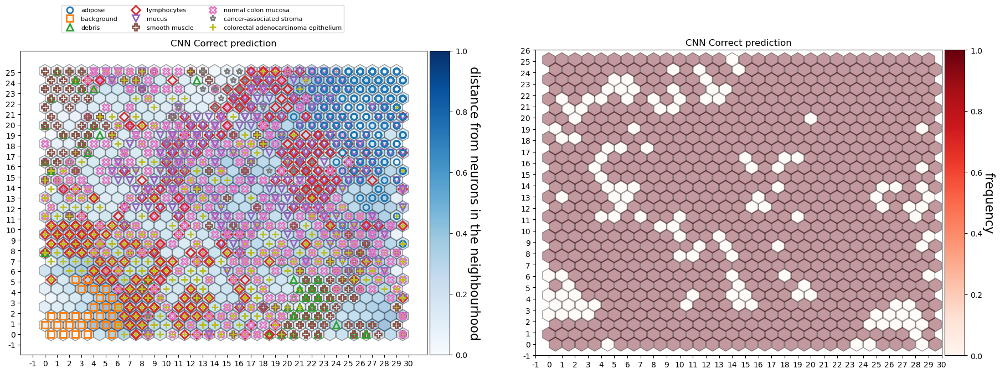

In [75]:
subplots_uheat_maps(my_som,
                    true_X,
                    true_y,
                    label_dict=LABEL_DICT,
                    savefig_path=PATH2TRUEFIG,
                    figname_umap= NAME4UMAP_TRUE,
                    figname_heatmap= NAME4HEATMAP_TRUE,
                    figname_all= NAME4BOTH_TRUE,
                    figtitle="CNN Correct prediction",
                    item2plot=len(true_X)
                    )

## 6.3. Algunas predicciones erróneas

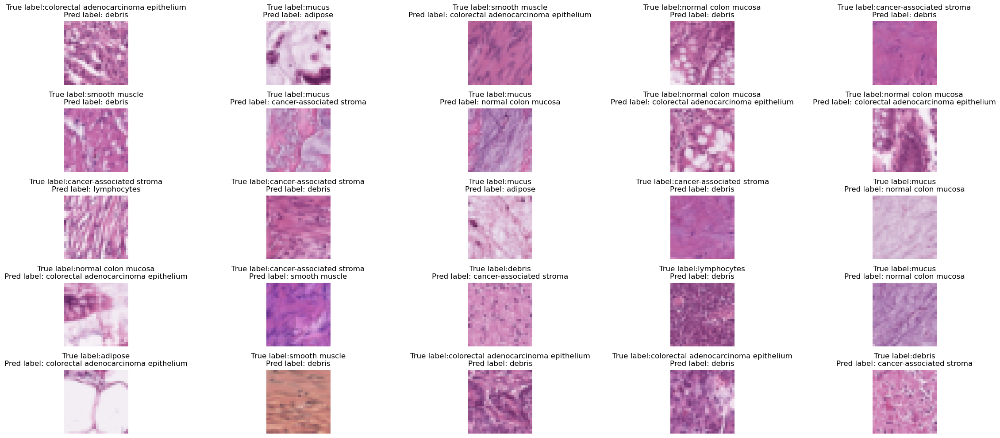

In [76]:
plot_some_wrongly_predicted_images(wrong_X,
                                   wrong_y,
                                   wrong_pred_y,
                                   save_fig_path=PATH2WRONGFIG,
                                   figname=NAME4WRONG_IMAGES,
                                   dataset=DATASET,)

## 6.4. Algunas predicciones correctas

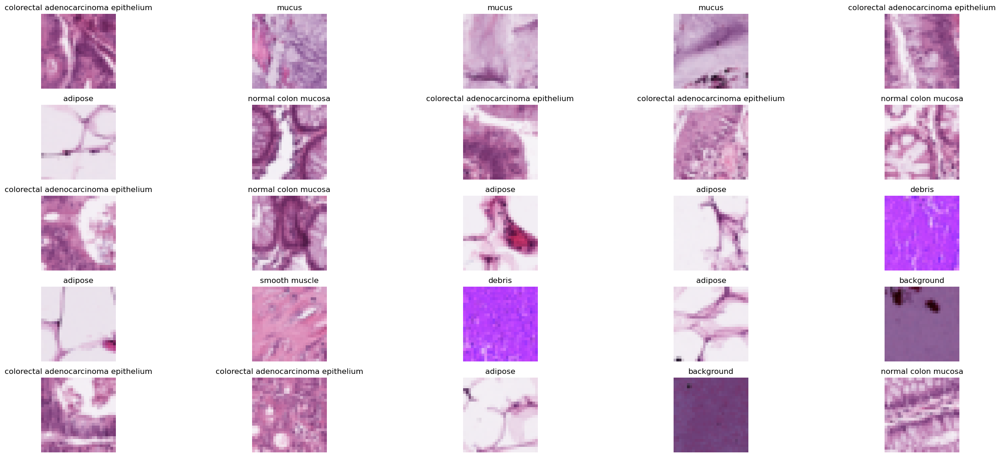

In [77]:
plot_some_images_with_label(true_X,
                            true_y,
                            save_fig_path=PATH2TRUEFIG,
                            figname=NAME4CORRECT_IMAGES,
                            dataset=DATASET,)

## 6.5. Conclusiones CNN

Accuracy = 81.35%. Comparando accuracies, es el mejor de todo, demostrando que para la clasificaciones de imágenes es el mejor intrumento. Aunque sigue hay confusiones en algunos tipos de tejidos, si nos fijamos en algunas imágenes mal clasificados, hay algunas que hasta es difícil diferenciarlo para nosotros.

Esto hace pensar que a lo mejor para este dataset complejo, una imagen con mayor resolución es necesario (128$\times$128 píxels, por ejemplo).

También hay que mencionar que para un CNN, la optimización en su arquitectura es importante, pero no es la idea de este proyecto. Además, no se hizo uso de un set de validación, que podría usarse para implementar el EarlyStopping en vez de fijar un número de épocas fijo, como lo estamos haciendo. No obstante, para hacernos una idea rápida de cada clasificador usando MedMNIST nuestro approach sería válido.


# 7. Conclusiones

Se contruyó un SOM con datos de train set, al que se mappearon todos los demás inputs (test-set, predicciones erróneas y correctas). Es posible que con dimensión 30$\times$30 puede quedarse corto para este dataset.

Se entrenaron 5 clasificadores para el Dataset `PathMNIST` dentro del `MedMNIST`:

1. **RandomClassfier**. Es el baseline para ver que no ocurren cosas raras con los demás clasificadores o el dataset. Su accuracy es de ~11%, lo esperable dado que hay 9 clases.
2. **NaiveBayesClassifier**. Se basa en densidad de cada píxel. Su accuracy es de 42.47%, principalmente debido a la clasificación del tejido adiposo y background, que están muy separados en el u-map contruido con el test-set entero.
3. **BaggingNaiveBayesClassfier**. Accuracy = 42.57%. En cuanto a las predicciones apenas hay diferencia comparado con el NaiveBayesClassfier.
4. **RandomForestClassifier**. Accuracy = 60.95%. Además de correcta clasificación en tejido adiposo y background, clasifica bien el tejido epitelial de adenocarcinoma colorrectal. NO hay comparación con un Decision-Tree individual, porque uno solo no es representativo, y las métricas pueden variar mucho entre un decision tree y otro.
5. CNN. Accuracy=81.35%. En general, clasifica bien, pero dado que la resolución de imágenes no es lo suficientemente alto para una tarea compleja de clasificación, hay imágenes que hasta un experto puede equivocarse en su clasificación debido a la similitud entre algunos tejidos.